### Mobile Phone Price Prediction

>A brief description about the dataset

Bob launched his own mobile business.  He wants to take on large corporations like Samsung, Apple, and others head-on.

 He has no idea how to calculate the cost of the mobile phones that his company makes. He gathers mobile phone sales data from different companies in order to address this issue.


 Bob wants to know if there is a connection between a mobile phone's selling price and its characteristics, such as internal memory and RAM. - (Kaggle, Abhishek Sharma)

#### Attribute Information

|Variable|Description|
|---|---|
|battery_power|Total energy a battery can store in one time measured in mAh|
|blue|Has bluetooth or not|
|clock_speed|speed at which microprocessor executes instructions|
|dual_sim|Has dual sim support or not|
|fc|Front Camera mega pixels|
|four_g|Has 4G or not|
|int_memory|Internal Memory in Gigabytes|
|m_dep|Mobile Depth in cm|
|mobile_wt|Weight of mobile phone|
|n_cores|Number of cores of processor|
|pc|Primary Camera mega pixels|
|px_height|Pixel Resolution Height|
|px_width|Pixel Resolution Width|
|ram|Random Access Memory in Megabytes|
|sc_h|Screen Height of mobile in cm|
|sc_w|Screen Width of mobile in cm|
|talk_time|longest time that a single battery charge will last when you are|
|three_g|Has 3G or not|
|touch_screen|Has touch screen or not|
|wifi|Has wifi or not|
|price_range|This is the target variable with value of 0(low cost), 1(medium cost), 2(high cost) and 3(very high cost)|

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.figure_factory as ff

In [2]:
mobiles_df_train = pd.read_csv("https://raw.githubusercontent.com/Sethu645/Projects-Data/main/train.csv")
mobiles_df_test = pd.read_csv("https://raw.githubusercontent.com/Sethu645/Projects-Data/main/test.csv") 

#### Data cleaning and preprocessing

In [3]:
mobiles_df_train.dropna()
mobiles_df_train.drop_duplicates()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,794,1,0.5,1,0,1,2,0.8,106,6,...,1222,1890,668,13,4,19,1,1,0,0
1996,1965,1,2.6,1,0,0,39,0.2,187,4,...,915,1965,2032,11,10,16,1,1,1,2
1997,1911,0,0.9,1,1,1,36,0.7,108,8,...,868,1632,3057,9,1,5,1,1,0,3
1998,1512,0,0.9,0,4,1,46,0.1,145,5,...,336,670,869,18,10,19,1,1,1,0


In [27]:
mobiles_df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             2000 non-null   int64  
 5   four_g         2000 non-null   int64  
 6   int_memory     2000 non-null   int64  
 7   m_dep          2000 non-null   float64
 8   mobile_wt      2000 non-null   int64  
 9   n_cores        2000 non-null   int64  
 10  pc             2000 non-null   int64  
 11  px_height      2000 non-null   int64  
 12  px_width       2000 non-null   int64  
 13  ram            2000 non-null   int64  
 14  sc_h           2000 non-null   int64  
 15  sc_w           2000 non-null   int64  
 16  talk_time      2000 non-null   int64  
 17  three_g        2000 non-null   int64  
 18  touch_sc

In [4]:
corr = mobiles_df_train.corr()

fig = ff.create_annotated_heatmap(
    z=np.round(corr.values, 2),
    x=corr.columns.tolist(),
    y=corr.index.tolist(),
    colorscale='Viridis'
)
fig.update_layout(title='Correlation Heatmap')
fig.show()

>Created a correlation plot to identify if there are any covaritaes that are highly correlated with the response `price_range`

In [5]:
fig = px.box(mobiles_df_train, x='price_range', y='ram',
             title='RAM Distribution Across Price Ranges',
             labels={'price_range': 'Price Range', 'ram': 'RAM (in MB)'})
fig.show()

In [6]:
X = mobiles_df_train.drop(columns = ["price_range"])
y = mobiles_df_train["price_range"]

In [7]:
from sklearn import tree 
from sklearn.model_selection import cross_val_score

In [8]:
classifier = tree.DecisionTreeClassifier(random_state = 1)

#### Performing 10 fold cross-validation to check if the model is able to predict the outcomes correctly 

In [9]:
cross_val_scores = cross_val_score(classifier, X, y, cv = 10, scoring = "accuracy")

In [10]:
print(f"10 fold cross validation scores :- {cross_val_scores}")
print(f"10 fold cross validation mean :- {cross_val_scores.mean()}")

10 fold cross validation scores :- [0.82  0.86  0.865 0.815 0.85  0.845 0.815 0.815 0.845 0.805]
10 fold cross validation mean :- 0.8334999999999999


>As all the individual cross validation scores are above 80% and the mean is 83.35%, this indicats that the model is predicting 4 out of 5 outcomes correctly.

#### Fitting the classifier model

In [11]:
classifier.fit(X, y)

DecisionTreeClassifier(random_state=1)

#### Feature Selection

>It is important because we can remove uncessary covariates inorder to make the model better

In [12]:
features = classifier.feature_importances_

In [13]:
importance_df = pd.DataFrame({
    "Feature" : features,
    "Importance" : X.columns
})

print(importance_df)

     Feature     Importance
0   0.099870  battery_power
1   0.004079           blue
2   0.001152    clock_speed
3   0.000000       dual_sim
4   0.006686             fc
5   0.000000         four_g
6   0.010528     int_memory
7   0.003776          m_dep
8   0.019295      mobile_wt
9   0.004071        n_cores
10  0.008302             pc
11  0.089138      px_height
12  0.093351       px_width
13  0.643024            ram
14  0.003732           sc_h
15  0.006817           sc_w
16  0.004625      talk_time
17  0.000667        three_g
18  0.000889   touch_screen
19  0.000000           wifi


#### Removing all the covariates that 

In [14]:
X_selected_features = mobiles_df_train.drop(columns = ["blue", "clock_speed", "dual_sim", "four_g", "m_dep", "n_cores", "sc_h", "talk_time", "three_g", "touch_screen", "wifi", "price_range"])
X_selected_features.head()

,battery_power,fc,int_memory,mobile_wt,pc,px_height,px_width,ram,sc_w
0,842,1,7,188,2,20,756,2549,7
1,1021,0,53,136,6,905,1988,2631,3
2,563,2,41,145,6,1263,1716,2603,2
3,615,0,10,131,9,1216,1786,2769,8
4,1821,13,44,141,14,1208,1212,1411,2


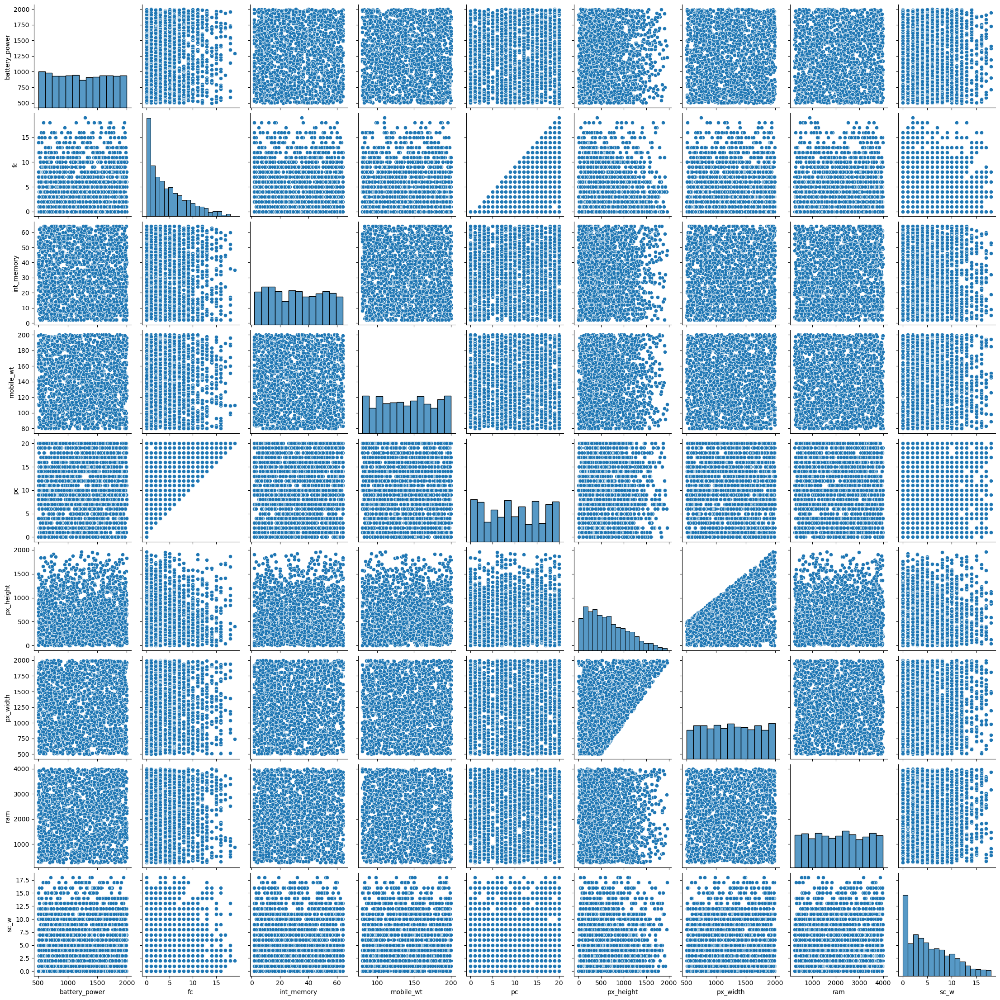

In [24]:
import seaborn as sns

sns.pairplot(data = X_selected_features)
plt.show()

#### Performing 10 fold cross-validation to check the accuracy of the new selected features

In [15]:
new_classifier = tree.DecisionTreeClassifier(random_state = 45)

In [16]:
new_features_cv_scores = cross_val_score(new_classifier, X_selected_features, y, cv = 10, scoring = "accuracy")

In [17]:
print(f"10 fold cross validation scores for new selected features :- {new_features_cv_scores}")
print(f"10 fold cross validation mean for new selected features:- {new_features_cv_scores.mean()}")

10 fold cross validation scores for new selected features :- [0.835 0.87  0.875 0.835 0.875 0.84  0.845 0.83  0.86  0.825]
10 fold cross validation mean for new selected features:- 0.849


#### Fitting the new classifier model

In [18]:
new_classifier.fit(X_selected_features, y)

DecisionTreeClassifier(random_state=45)

>At this point there are two classifier models ("classifier" and "new_classifier") whose cross-validations scores are 83.35% and 84.9%. This clearly indicates that the "new_classifier" is better at predicting outcomes. The main difference betwen both the models is that in the "classifier" model all features were given equal importance and in the "new_classifier" model features that are not contributing approximately atleast 1% were removed. 

#### Findings



`battery_power` and `ram` are the two covariates that are highly influncing the `price_range` of the mobiles. Apart from them `fc`(front camera megapixels), `int_memory` (internal memory), `mobile_wt` (mobile weight), `pc` (primary camera mega pixels), `px_height` (pixel resolution height), `px_width` (pixel resolution width) and `sc_w` (screen width of mobile in cm) are also minimally influencing variables in determinig the `price_range`.

#### Results

In [19]:
X_test = mobiles_df_test.drop(columns = ["blue", "clock_speed", "dual_sim", "four_g", "m_dep", "n_cores", "sc_h", "talk_time", "three_g", "touch_screen", "wifi", "id"])

In [20]:
y_pred = new_classifier.predict(X_test)

In [22]:
y_pred

array([3, 3, 2, 3, 1, 3, 3, 1, 3, 0, 3, 3, 0, 0, 2, 1, 2, 0, 3, 2, 0, 3,
       2, 1, 3, 0, 2, 0, 3, 0, 2, 0, 3, 0, 0, 2, 3, 1, 2, 1, 1, 2, 0, 0,
       0, 1, 0, 3, 1, 2, 1, 0, 2, 0, 3, 1, 3, 1, 1, 3, 3, 2, 0, 1, 1, 1,
       1, 2, 1, 2, 1, 2, 2, 3, 3, 0, 2, 1, 2, 3, 1, 3, 3, 0, 3, 0, 3, 0,
       2, 0, 1, 2, 2, 0, 2, 1, 0, 2, 2, 3, 1, 0, 0, 3, 1, 2, 0, 1, 2, 3,
       3, 2, 1, 3, 3, 3, 3, 2, 3, 0, 0, 3, 2, 1, 2, 0, 3, 3, 3, 1, 0, 2,
       1, 1, 3, 0, 1, 0, 3, 2, 1, 3, 1, 3, 2, 3, 3, 2, 2, 3, 2, 3, 1, 0,
       3, 2, 3, 3, 3, 3, 3, 2, 3, 3, 3, 3, 0, 0, 3, 1, 0, 0, 2, 0, 0, 2,
       1, 0, 1, 2, 0, 0, 0, 1, 2, 2, 2, 1, 0, 0, 0, 1, 0, 3, 2, 0, 2, 2,
       2, 3, 1, 2, 3, 3, 3, 1, 2, 1, 0, 0, 1, 2, 0, 2, 3, 3, 0, 2, 0, 3,
       2, 2, 3, 1, 0, 1, 1, 3, 0, 1, 0, 2, 2, 1, 3, 0, 3, 0, 3, 1, 2, 0,
       0, 2, 1, 3, 2, 3, 1, 1, 3, 0, 0, 2, 3, 3, 1, 3, 1, 0, 2, 2, 1, 2,
       3, 3, 3, 1, 1, 0, 2, 2, 2, 1, 3, 2, 0, 3, 0, 0, 2, 0, 0, 3, 2, 3,
       3, 2, 1, 3, 3, 2, 3, 1, 2, 1, 2, 0, 2, 3, 1,